In [ ]:
import logging
import os

import matplotlib.pyplot as plt
import pandas as pd
# Plotly graphs have more features than seaborn, like interactive hover text & zoom, but they don't show up in pdfs
import plotly.express as px
import seaborn as sns

logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.CRITICAL)
logger = logging.getLogger('gensim')
logger.setLevel(logging.INFO)

import ihop.community2vec
import ihop.import_data

In [ ]:
spark

Out[2]:

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.2.0 
 Master 
 spark://10.51.244.94:7077 
 AppName 
 Databricks Shell

In [ ]:
#spark = ihop.utils.get_spark_session("Community2vec Notebook", driver_mem="8G")

In [ ]:
AWS_BUCKET_NAME = "db-6c4d908823d195589460f58b60f76c4f-s3-root-bucket"
MOUNT_NAME = "s3bucket"
dbutils.fs.mount("s3a://%s" % AWS_BUCKET_NAME,  "/mnt/%s" % MOUNT_NAME)
display(dbutils.fs.ls("/mnt/s3bucket"))

In [ ]:
display(dbutils.fs.ls("/mnt/s3bucket"))
display(dbutils.fs.ls("/mnt/s3bucket/community2vec"))

path,name,size,modificationTime
dbfs:/mnt/s3bucket/Test/,Test/,0,1642906954179
dbfs:/mnt/s3bucket/baby.csv,baby.csv,27639,1642694751000
dbfs:/mnt/s3bucket/community2vec/,community2vec/,0,1642906954179
dbfs:/mnt/s3bucket/nvirginia-prod/,nvirginia-prod/,0,1642906954179


path,name,size,modificationTime
dbfs:/mnt/s3bucket/community2vec/RC_2021-06/,RC_2021-06/,0,1642906954262
dbfs:/mnt/s3bucket/community2vec/sample_data/,sample_data/,0,1642906954262
dbfs:/mnt/s3bucket/community2vec/subreddit_analogies.txt,subreddit_analogies.txt,4115395,1642905264000


In [ ]:
target_data = "RC_2021-06"
#target_data = "sample_data"
dataroot = "/dbfs/mnt/s3bucket/community2vec/" + target_data
subreddit_counts_csv = os.path.join(dataroot, "subreddit_counts.csv")
user_context_path = os.path.join(dataroot, "user_contexts")
spark_user_contexts = "/mnt/s3bucket/community2vec/" + target_data + "/user_contexts"
vector_save_path = os.path.join(dataroot, "01222022_c2v_vectors_on_databricks")
analogies_path = "/dbfs/mnt/s3bucket/community2vec/subreddit_analogies.txt"

In [ ]:
vocab = ihop.community2vec.get_vocabulary(subreddit_counts_csv)
print("VOCAB SIZE:", len(vocab))
print("VOCAB SNIPPET:")
for i, (k,v) in enumerate(vocab.items()):
    print(k,":",v)
    if i>10:
        break

print("TOTAL COMMENT COUNT:", sum(vocab.values()))

VOCAB SIZE: 10000
VOCAB SNIPPET:
AskReddit : 6235881
FreeKarma4U : 3355746
Superstonk : 2653876
memes : 2233307
wallstreetbets : 2186516
nba : 2062580
amcstock : 1709087
soccer : 1609806
teenagers : 1568039
CryptoCurrency : 1295091
AmItheAsshole : 1083268
politics : 1034608
TOTAL COMMENT COUNT: 190094923

In [ ]:
vocab_df = pd.DataFrame.from_records(list(vocab.items()), columns=["subreddit", "comments"])
fig = px.bar(vocab_df, x="subreddit", y="comments", title="Number of Comments in each Subreddit")
fig.show()

In [ ]:
display(vocab_df)

subreddit,comments
AskReddit,6235881
FreeKarma4U,3355746
Superstonk,2653876
memes,2233307
wallstreetbets,2186516
nba,2062580
amcstock,1709087
soccer,1609806
teenagers,1568039
CryptoCurrency,1295091


# Baseline Community2Vec model

In [ ]:
from ihop.community2vec import GensimCommunity2Vec

myc2v = GensimCommunity2Vec.init_with_spark(spark, vocab, spark_user_contexts, epochs=5, alpha=0.05, workers=16, sample=0.005)
myc2v.contexts_path = user_context_path


2022-01-23 03:05:54,151 : INFO : Word2Vec lifecycle event {'params': 'Word2Vec(vocab=0, vector_size=150, alpha=0.05)', 'datetime': '2022-01-23T03:05:54.151416', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'created'}
2022-01-23 03:05:54,151 : INFO : Processing provided word frequencies
2022-01-23 03:05:54,151 : INFO : collected 10000 unique word types, with total frequency of 190094923
2022-01-23 03:05:54,151 : INFO : Creating a fresh vocabulary
2022-01-23 03:05:54,186 : INFO : Word2Vec lifecycle event {'msg': 'effective_min_count=0 retains 10000 unique words (100.0%% of original 10000, drops 0)', 'datetime': '2022-01-23T03:05:54.186453', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'prepare_vocab'}
2022-01-23 03:05:54,186 : INFO : Word2Vec lifecycle event {'msg': 'effective_min_count=0 leaves 190094923 word corpus (100.0%% of original 190094923, drops 0)', 'datetime': '2022-01-23T03:05:54.186636', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'prepare_vocab'}
2022-01-23 03:05:54,236 : INFO : deleting the raw counts dictionary of 10000 items
2022-01-23 03:05:54,236 : INFO : sample=0.005 downsamples 3 most-common words
2022-01-23 03:05:54,236 : INFO : Word2Vec lifecycle event {'msg': 'downsampling leaves estimated 186509547.69593427 word corpus (98.1%% of prior 190094923)', 'datetime': '2022-01-23T03:05:54.236308', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'prepare_vocab'}
2022-01-23 03:05:54,326 : INFO : estimated required memory for 10000 words and 150 dimensions: 17000000 bytes
2022-01-23 03:05:54,326 : INFO : resetting layer weights

In [ ]:
print("CHECK INITIALIZATION")
print("Longest sentence:", myc2v.max_comments)
print("Num sentences:", myc2v.num_users)
print("Random embeddings nearest neighbor:", myc2v.w2v_model.wv.most_similar("AskReddit"))
print("Gensim will read files from:", myc2v.contexts_path)


CHECK INITIALIZATION
Longest sentence: 5441636
Num sentences: 6531310
Random embeddings nearest neighbor: [('MaladaptiveDreaming', 0.2792366147041321), ('Buffalo', 0.26713940501213074), ('Strongman', 0.26547014713287354), ('DCComicsLegendsGame', 0.26509010791778564), ('abusiverelationships', 0.2635398209095001), ('buildmeapc', 0.25625988841056824), ('pelotoncycle', 0.2560443878173828), ('smoking', 0.25592470169067383), ('CaliSissies', 0.2520269751548767), ('nancydrew', 0.24935145676136017)]
Gensim will read files from: /dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts

In [ ]:
analogies_score, details = myc2v.score_analogies(analogies_path)
print("Analogies accuracy after random initialization:", analogies_score)

2022-01-23 03:05:54,498 : INFO : Evaluating word analogies for top 10001 words in the model on /dbfs/mnt/s3bucket/community2vec/subreddit_analogies.txt
2022-01-23 03:05:54,948 : INFO : major-league-baseball: 0.0% (0/406)
2022-01-23 03:05:55,333 : INFO : national-basketball-association: 0.0% (0/435)
2022-01-23 03:05:55,706 : INFO : national-football-league: 0.0% (0/378)
2022-01-23 03:05:55,909 : INFO : national-hockey-league: 0.0% (0/253)
2022-01-23 03:05:57,131 : INFO : university-city-pairs: 0.0% (0/861)
2022-01-23 03:05:57,132 : INFO : Quadruplets with out-of-vocabulary words: 98.0%
2022-01-23 03:05:57,132 : INFO : NB: analogies containing OOV words were skipped from evaluation! To change this behavior, use "dummy4unknown=True"
2022-01-23 03:05:57,132 : INFO : Total accuracy: 0.0% (0/2333)
Analogies accuracy after random initialization: 0.0

In [ ]:
myc2v.train(save_vectors_prefix = vector_save_path, compute_loss=True, analogies_path=analogies_path)

2022-01-23 03:10:37,579 : INFO : reading directory /dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/
2022-01-23 03:10:37,596 : INFO : files read into PathLineSentences:/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00000-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00001-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00002-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00003-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00004-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00005-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00006-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00007-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00008-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00009-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00010-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00011-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00012-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00013-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00014-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00015-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00016-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00017-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00018-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00019-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00020-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00021-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00022-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00023-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00024-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00025-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00026-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00027-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00028-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00029-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00030-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3bucket/community2vec/RC_2021-06/user_contexts/part-00031-08850d52-a865-4251-aeb6-ea21136f00bc-c000.csv.bz2
/dbfs/mnt/s3buc

In [ ]:
print(myc2v.w2v_model.get_latest_training_loss())

134217728.0

In [ ]:
myc2v.w2v_model.wv.most_similar("AskReddit", topn=10)

Out[59]: [('Showerthoughts', 0.7519167065620422),
 ('funny', 0.7376868724822998),
 ('AskMen', 0.7342010736465454),
 ('mildlyinteresting', 0.7337262034416199),
 ('todayilearned', 0.7336031198501587),
 ('tifu', 0.7323617935180664),
 ('pics', 0.7298635244369507),
 ('coolguides', 0.7278692722320557),
 ('unpopularopinion', 0.7274165749549866),
 ('explainlikeimfive', 0.7245519757270813)]

In [ ]:
myc2v.w2v_model.wv.most_similar("news", topn=10)

Out[60]: [('nottheonion', 0.8613042235374451),
 ('science', 0.8492043614387512),
 ('byebyejob', 0.8365247249603271),
 ('todayilearned', 0.8345869779586792),
 ('pics', 0.831337571144104),
 ('UpliftingNews', 0.8236547112464905),
 ('OldSchoolCool', 0.8195003271102905),
 ('worldnews', 0.818304181098938),
 ('JusticeServed', 0.8174245357513428),
 ('LeopardsAteMyFace', 0.8134621381759644)]

In [ ]:
# Save vectors
myc2v.save_vectors(vector_save_path)

2022-01-25 01:15:24,446 : INFO : KeyedVectors lifecycle event {'fname_or_handle': '/dbfs/mnt/s3bucket/community2vec/RC_2021-06/01222022_c2v_vectors_on_databricks', 'separately': 'None', 'sep_limit': 10485760, 'ignore': frozenset(), 'datetime': '2022-01-25T01:15:24.446613', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'saving'}
2022-01-25 01:15:24,973 : INFO : saved /dbfs/mnt/s3bucket/community2vec/RC_2021-06/01222022_c2v_vectors_on_databricks

In [ ]:
analogies_score, details = myc2v.score_analogies(analogies_path)
print("Analogies accuracy after training:", analogies_score)

2022-01-25 01:15:25,015 : INFO : Evaluating word analogies for top 10001 words in the model on /dbfs/mnt/s3bucket/community2vec/subreddit_analogies.txt
2022-01-25 01:15:25,196 : INFO : major-league-baseball: 19.5% (79/406)
2022-01-25 01:15:25,384 : INFO : national-basketball-association: 26.9% (117/435)
2022-01-25 01:15:25,540 : INFO : national-football-league: 21.2% (80/378)
2022-01-25 01:15:25,650 : INFO : national-hockey-league: 23.7% (60/253)
2022-01-25 01:15:26,529 : INFO : university-city-pairs: 7.2% (62/861)
2022-01-25 01:15:26,530 : INFO : Quadruplets with out-of-vocabulary words: 98.0%
2022-01-25 01:15:26,530 : INFO : NB: analogies containing OOV words were skipped from evaluation! To change this behavior, use "dummy4unknown=True"
2022-01-25 01:15:26,530 : INFO : Total accuracy: 17.1% (398/2333)
Analogies accuracy after training: 0.17059579939991426

## TSNE projection 
Visualize vectors to sanity check using t-SNE projection without any cluster assignments

In [ ]:
from gensim.models import KeyedVectors
trained_vectors = KeyedVectors.load(vector_save_path)

2022-01-26 16:19:13,301 : INFO : loading KeyedVectors object from /dbfs/mnt/s3bucket/community2vec/RC_2021-06/01222022_c2v_vectors_on_databricks
2022-01-26 16:19:13,379 : INFO : KeyedVectors lifecycle event {'fname': '/dbfs/mnt/s3bucket/community2vec/RC_2021-06/01222022_c2v_vectors_on_databricks', 'datetime': '2022-01-26T16:19:13.379819', 'gensim': '4.1.2', 'python': '3.8.10 (default, Nov 26 2021, 20:14:08) \n[GCC 9.3.0]', 'platform': 'Linux-5.4.0-1059-aws-x86_64-with-glibc2.29', 'event': 'loaded'}

In [ ]:
# Note: Can't use get_tsne_dataframe from the original python code b/c it gives a type error related to the learning_rate="auto" param in Sklearn's TSNE init
from sklearn.manifold import TSNE
import numpy as np 

tsne_fitter = TSNE(init="pca", metric="cosine", square_distances=True)
# tsne_proj = tsne_fitter.fit_transform(myc2v.w2v_model.wv.get_normed_vectors())
tsne_proj = tsne_fitter.fit_transform(trained_vectors.get_normed_vectors())

dataframe_elements = list()

#for i, vocab_elem in enumerate(myc2v.w2v_model.wv.index_to_key):
for i, vocab_elem in enumerate(trained_vectors.index_to_key):
    elem_proj = tsne_proj[i]
    dataframe_elements.append((vocab_elem, elem_proj[0], elem_proj[1]))

tsne_df = pd.DataFrame.from_records(dataframe_elements, columns=["subreddit", "tsne_x", "tsne_y"])
display(tsne_df.head())


subreddit,tsne_x,tsne_y
AskReddit,23.603612899780273,-36.920265197753906
FreeKarma4U,-25.59396743774414,90.3886947631836
Superstonk,-54.98331069946289,-28.288389205932617
memes,25.203075408935547,-26.954635620117188
wallstreetbets,-54.40611267089844,-29.91303253173828


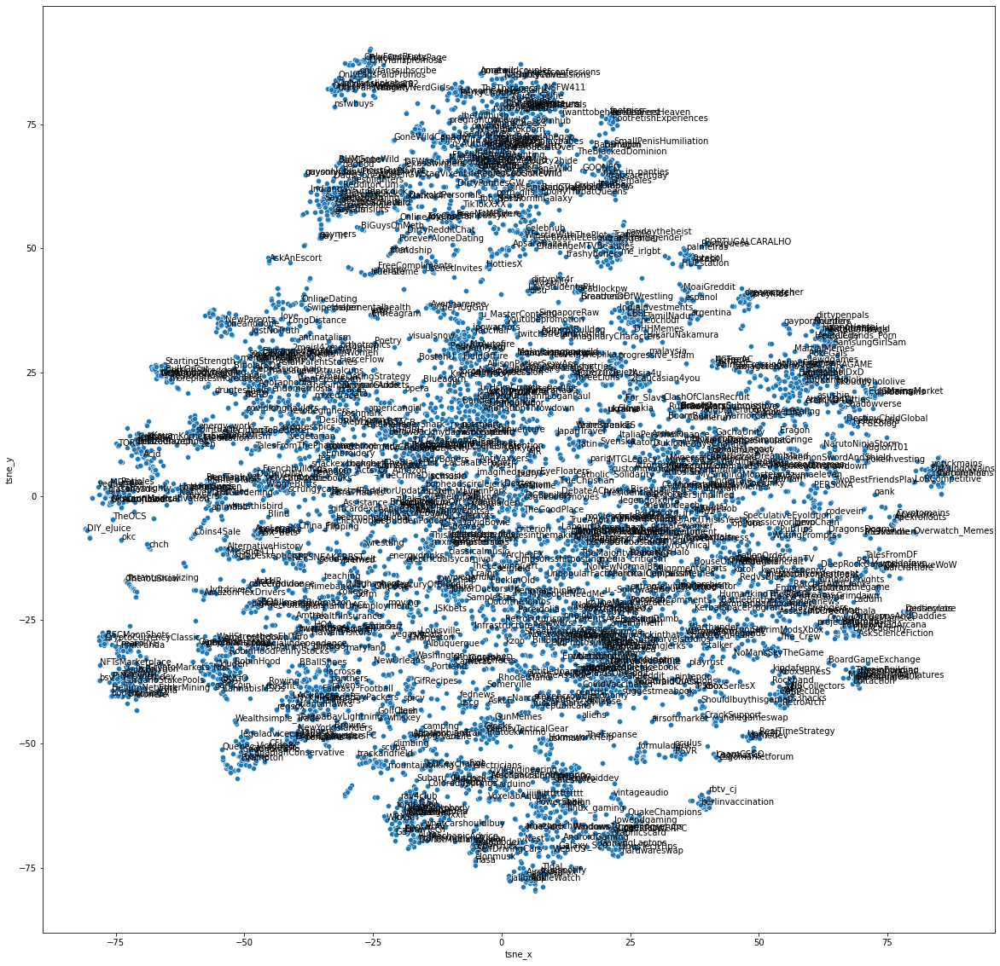

In [ ]:
# Label subset in visualization so it's actually readable
plt.figure(figsize=(20,20))
ax = sns.scatterplot(data=tsne_df, x="tsne_x", y="tsne_y")
#for i, subreddit in enumerate(myc2v.get_index_to_key()):
for i, subreddit in enumerate(trained_vectors.index_to_key):
    if i%10==0:
        ax.text(tsne_proj[i][0], tsne_proj[i][1], subreddit)

In [ ]:
fig = px.scatter(tsne_df, x="tsne_x", y="tsne_y", text="subreddit", hover_data=["subreddit"])
fig.show()

# Clustering & Comparing Types of Clustering
This demonstrates some types of clustering on subreddits community embeddings scores. 
Unsupervised clustering is difficult to evaluate since there aren't gold standard labels, however we can look at the overlap and dispersion of clusters using:
 - [Silhouette Coefficient](https://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient): Ranges between -1 (clustering is totally incorrect) and 1 (clusters are dense and well separated), scores around 0 indicate overlapping clusters.
 - [Calinski-Harabasz Index](https://scikit-learn.org/stable/modules/clustering.html#calinski-harabasz-index): Higher for models with clusters that are dense and well separated
 - [Davies-Bouldin Index](https://scikit-learn.org/stable/modules/clustering.html#davies-bouldin-index): Measures separation/similarity between clusters by taking ratio of within-cluster distances to between-cluster distances. The minimum is zero, lower scores indicate better separation

In [ ]:
from sklearn.cluster import KMeans, AffinityPropagation, AgglomerativeClustering, DBSCAN
from sklearn import metrics
import numpy as np

#vocab_list = myc2v.get_index_to_key()
vocab_list = trained_vectors.index_to_key
#embeddings = myc2v.get_normed_vectors()
embeddings = trained_vectors.get_normed_vectors()
clustering_metrics = list()

def compute_and_print_metrics(clustering_model, embeddings):
    labels = clustering_model.labels_
    if len(set(labels)) > 1:
        silhouette = metrics.silhouette_score(embeddings, labels, metric="cosine")
        print("Silhouette:", silhouette)
        ch_index = metrics.calinski_harabasz_score(embeddings, labels)
        print("Calinski-Harabasz Index:", ch_index)
        db_index = metrics.davies_bouldin_score(embeddings, labels)
        print("Davies-Bouldin Index:", db_index)
        return silhouette, ch_index, db_index
    else:
        print("One clustering found")
        return None, None, None

def cluster_results_as_df(cluster_labels, vocab_elements, tsne_df, cluster_col_name, vocab_col_name="subreddit"):
    """Return pandas dataframe with both tsne values and cluster labels
    :param cluster_labels: list, cluster assignment for each indexed vocab element
    :param vocab_elements: list, indexed vocab elements, same order and length as cluster labels
    :param tsne_df: pandas DataFrame, tsne coordinates (or other )
    :param cluter_col_name: str, how to name the cluster label column in the dataframe
    :param vocab_col_name: str, name of column for vocab elements to join on with tsne_df
    """
    cluster_df = pd.DataFrame({vocab_col_name: vocab_elements, cluster_col_name:cluster_labels})
    cluster_df[cluster_col_name] = cluster_df[cluster_col_name].astype('category')
    cluster_df = pd.merge(cluster_df, tsne_df, how="inner", on="subreddit", sort=False)
    return cluster_df


## KMeans Clustering

In [ ]:
kmeans_model = KMeans(n_clusters=250, random_state=100)
kmeans_clusters = kmeans_model.fit_predict(embeddings)

In [ ]:
kmeans_df = cluster_results_as_df(kmeans_clusters, vocab_list, tsne_df, 'kmeans_cluster')
kmeans_df.head()

Out[213]:

,subreddit,kmeans_cluster,tsne_x,tsne_y
0,AskReddit,3,23.603613,-36.920265
1,FreeKarma4U,204,-25.593967,90.388695
2,Superstonk,63,-54.983311,-28.288389
3,memes,152,25.203075,-26.954636
4,wallstreetbets,63,-54.406113,-29.913033


In [ ]:
fig = px.scatter(kmeans_df, x="tsne_x", y="tsne_y", color="kmeans_cluster", hover_data=["subreddit", "kmeans_cluster"], title="KMeans clusters of Subreddits Embeddings using Community2Vec")
fig.show()

Out[215]:

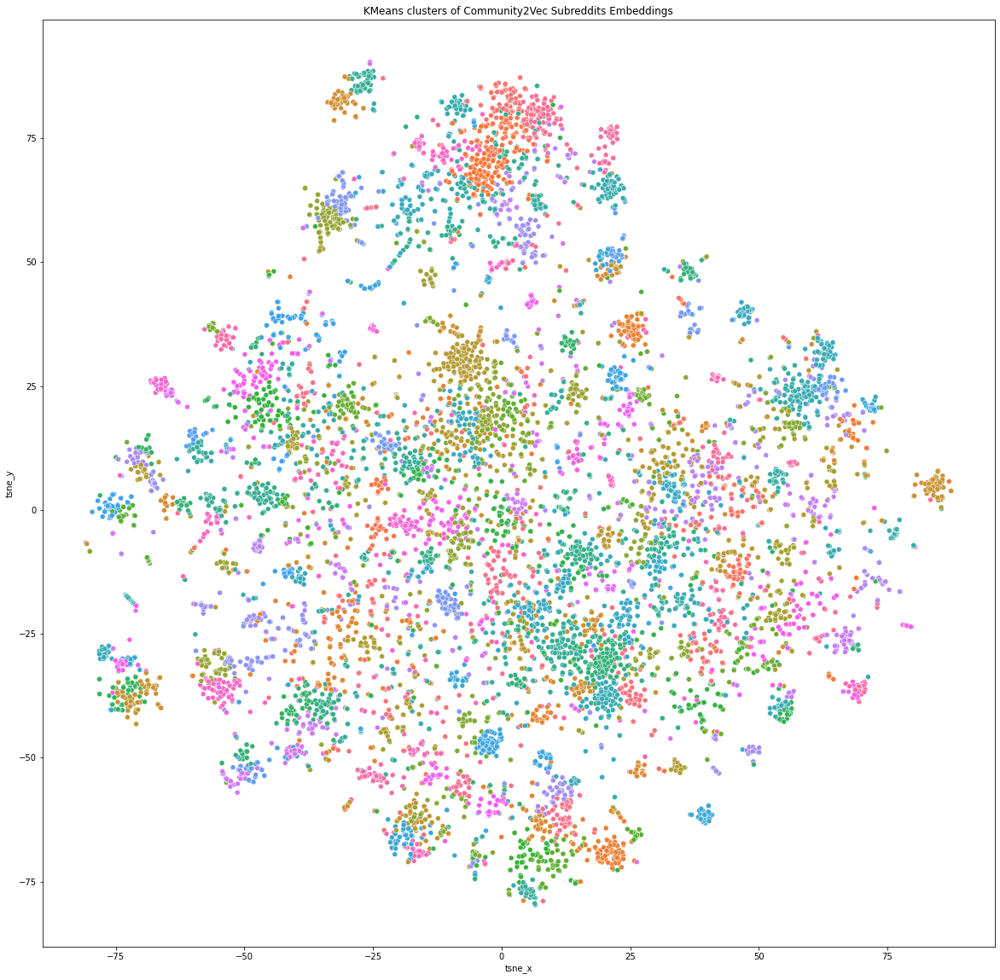

Text(0.5, 1.0, 'KMeans clusters of Community2Vec Subreddits Embeddings')

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(data=kmeans_df, x="tsne_x", y="tsne_y", hue="kmeans_cluster", legend=False).set_title("KMeans clusters of Community2Vec Subreddits Embeddings")

In [ ]:
s, ch, db = compute_and_print_metrics(kmeans_model, embeddings)
clustering_metrics.append(("kmeans", s, ch, db))

Silhouette: 0.073322125
Calinski-Harabasz Index: 22.494300334273646
Davies-Bouldin Index: 3.3134357143182367

## Affinity Propagation

In [ ]:
# Get pairwise cosine similarity for all subreddits
precomputed_distances = np.zeros((len(vocab_list),len(vocab_list)))
for i, w in enumerate(vocab_list):
    #precomputed_distances[i] = np.array(myc2v.w2v_model.wv.distances(w))
    precomputed_distances[i] = np.array(trained_vectors.distances(w))

In [ ]:
affinity_prop_model = AffinityPropagation(affinity="precomputed", random_state=2, convergence_iter=100, max_iter=1000)
affinity_prop_clusters = affinity_prop_model.fit_predict(precomputed_distances)

In [ ]:
affinity_prop_df = cluster_results_as_df(affinity_prop_clusters, vocab_list, tsne_df, 'affinity_prop_cluster')
affinity_prop_df.head()

Out[220]:

,subreddit,affinity_prop_cluster,tsne_x,tsne_y
0,AskReddit,94,23.603613,-36.920265
1,FreeKarma4U,57,-25.593967,90.388695
2,Superstonk,117,-54.983311,-28.288389
3,memes,94,25.203075,-26.954636
4,wallstreetbets,118,-54.406113,-29.913033


In [ ]:
fig = px.scatter(affinity_prop_df, x="tsne_x", y="tsne_y", color="affinity_prop_cluster", hover_data=["subreddit", "affinity_prop_cluster"])
fig.show()

Out[222]:

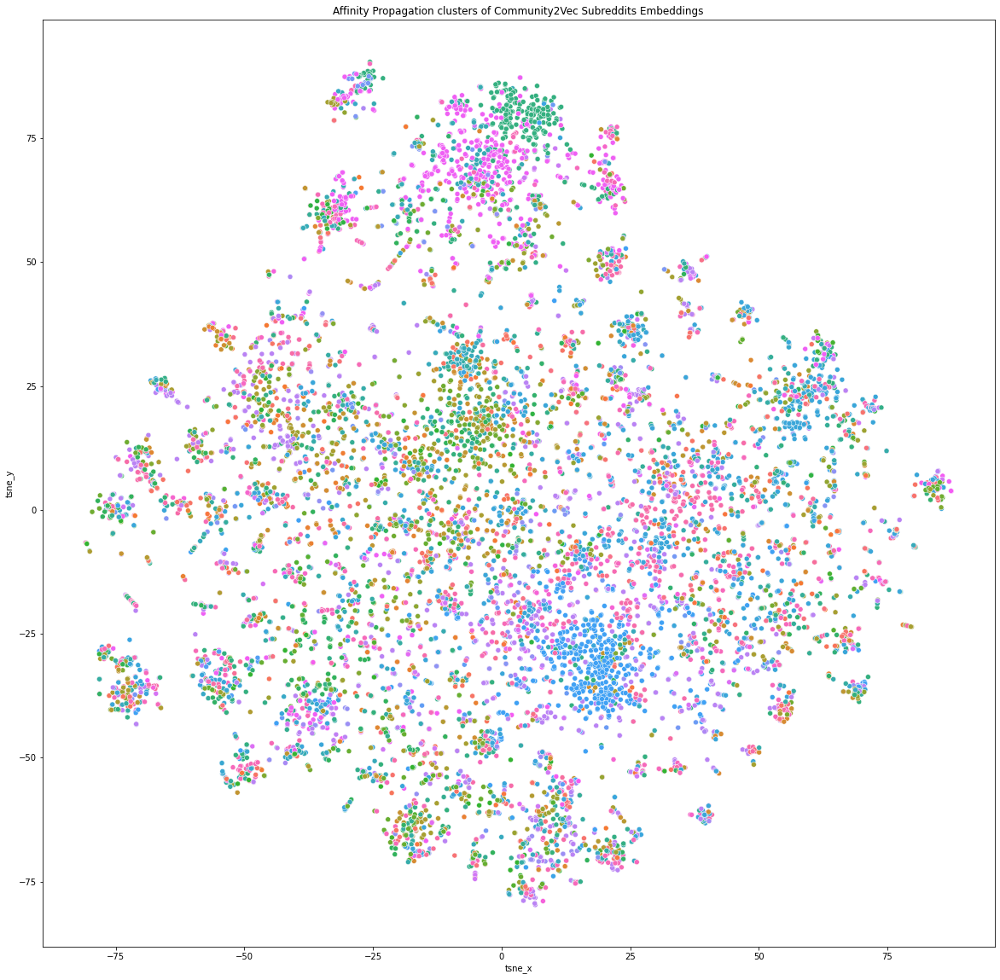

Text(0.5, 1.0, 'Affinity Propagation clusters of Community2Vec Subreddits Embeddings')

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(data=affinity_prop_df, x="tsne_x", y="tsne_y", hue="affinity_prop_cluster", legend=False).set_title("Affinity Propagation clusters of Community2Vec Subreddits Embeddings")

In [ ]:
s, ch, db = compute_and_print_metrics(affinity_prop_model, embeddings)
clustering_metrics.append(("affinity_propagation", s, ch, db))

Silhouette: -0.05802953
Calinski-Harabasz Index: 11.331643682867153
Davies-Bouldin Index: 5.745629482345926

## Agglomerative Clustering

In [ ]:
agglomerative_model = AgglomerativeClustering(n_clusters=250, affinity='cosine', linkage="average")
agglomerative_clusters = agglomerative_model.fit_predict(embeddings)

In [ ]:
agglomerative_df = cluster_results_as_df(agglomerative_clusters, vocab_list, tsne_df, 'agglomerative_cluster')
agglomerative_df.head()

Out[225]:

,subreddit,agglomerative_cluster,tsne_x,tsne_y
0,AskReddit,30,23.603613,-36.920265
1,FreeKarma4U,34,-25.593967,90.388695
2,Superstonk,8,-54.983311,-28.288389
3,memes,30,25.203075,-26.954636
4,wallstreetbets,8,-54.406113,-29.913033


In [ ]:
fig = px.scatter(agglomerative_df, x="tsne_x", y="tsne_y", color='agglomerative_cluster', hover_data=["subreddit", 'agglomerative_cluster'])
fig.show()

Out[227]:

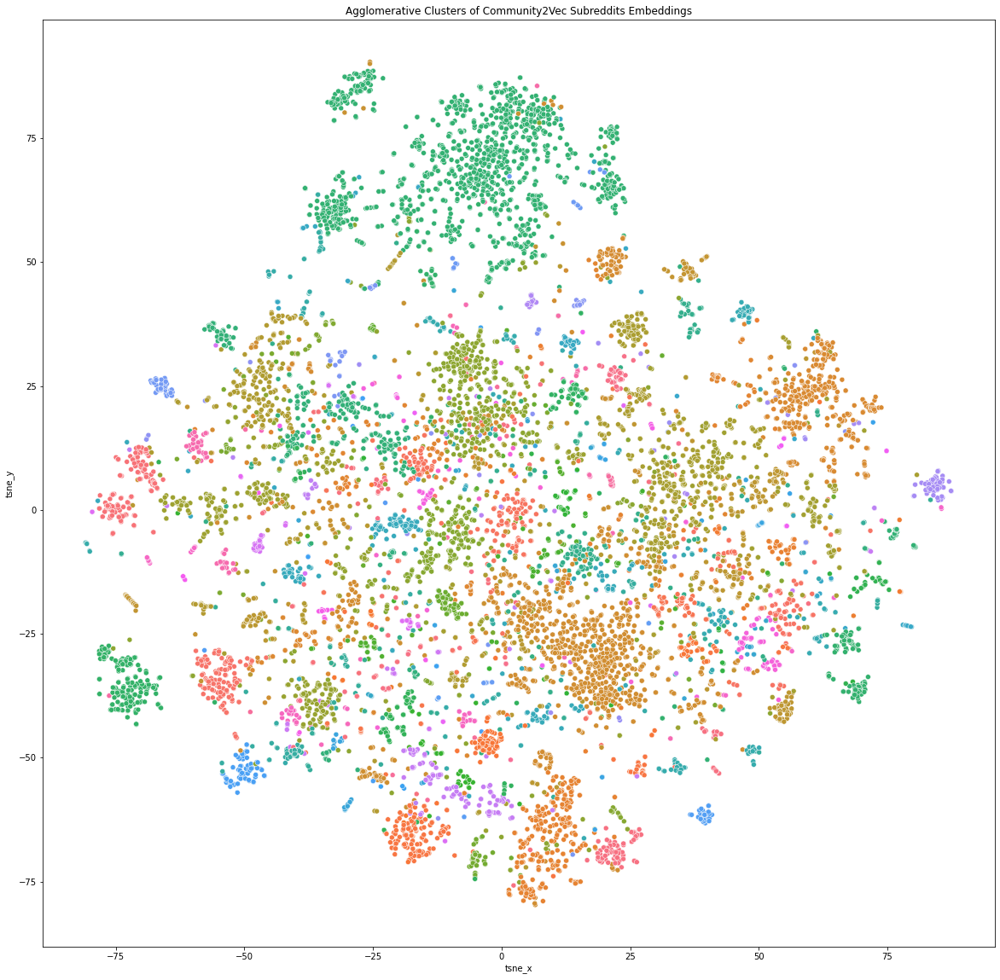

Text(0.5, 1.0, 'Agglomerative Clusters of Community2Vec Subreddits Embeddings')

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(data=agglomerative_df, x="tsne_x", y="tsne_y", hue="agglomerative_cluster", legend=False).set_title("Agglomerative Clusters of Community2Vec Subreddits Embeddings")

In [ ]:
# TODO agglomerative clustering is hierarchical, so we should create a dentrite/tree structure plot for these results as well

In [ ]:
s, ch, db = compute_and_print_metrics(agglomerative_model, embeddings)
clustering_metrics.append(("agglomerative", s, ch, db))

Silhouette: 0.06084668
Calinski-Harabasz Index: 15.210821623205948
Davies-Bouldin Index: 2.575809300997088

## DBSCAN clusters
Cluster out by finding areas of high density

In [ ]:
dbscan_model = DBSCAN(metric="cosine", eps=0.5)
dbscan_clusters = dbscan_model.fit_predict(embeddings)

In [ ]:
dbscan_df = cluster_results_as_df(dbscan_clusters, vocab_list, tsne_df, 'dbscan_cluster')
dbscan_df.head()

Out[231]:

,subreddit,dbscan_cluster,tsne_x,tsne_y
0,AskReddit,0,23.603613,-36.920265
1,FreeKarma4U,0,-25.593967,90.388695
2,Superstonk,0,-54.983311,-28.288389
3,memes,0,25.203075,-26.954636
4,wallstreetbets,0,-54.406113,-29.913033


In [ ]:
fig = px.scatter(dbscan_df, x="tsne_x", y="tsne_y", color='dbscan_cluster', hover_data=["subreddit", 'dbscan_cluster'])
fig.show()

Out[233]:

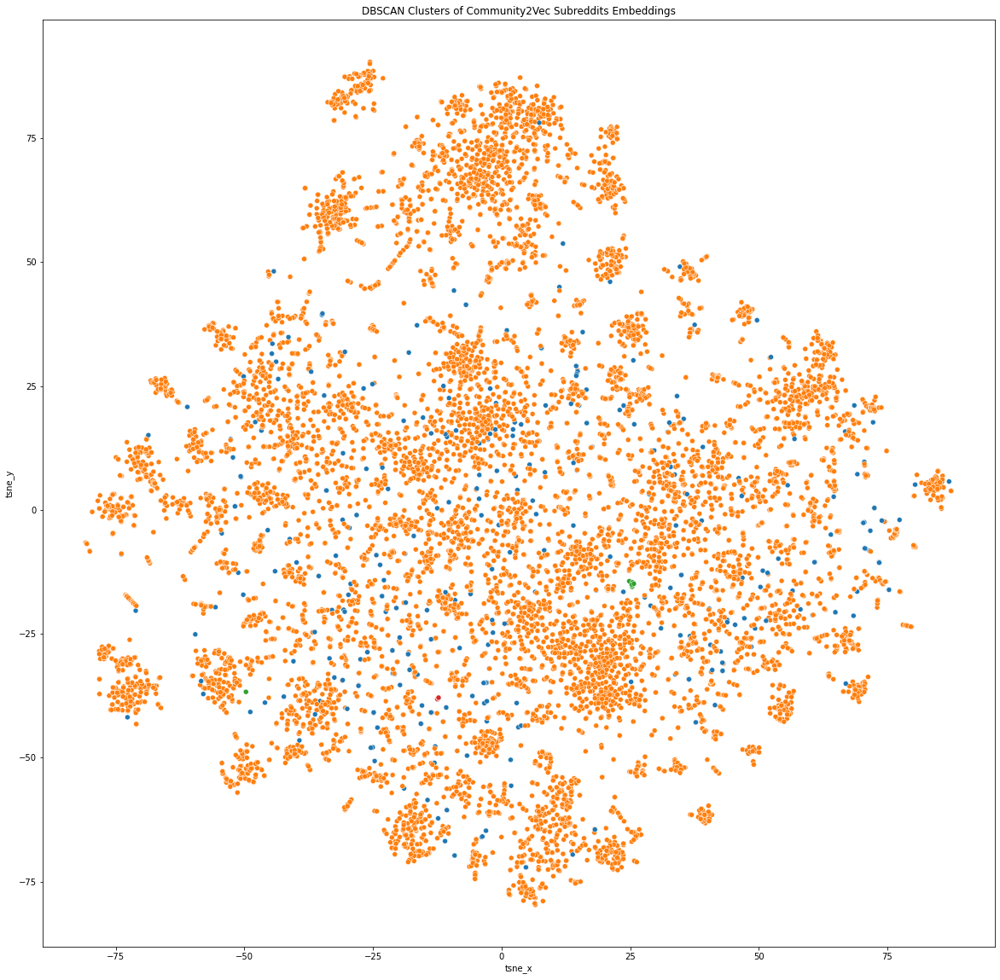

Text(0.5, 1.0, 'DBSCAN Clusters of Community2Vec Subreddits Embeddings')

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(data=dbscan_df, x="tsne_x", y="tsne_y", hue="dbscan_cluster", legend=False).set_title("DBSCAN Clusters of Community2Vec Subreddits Embeddings")

In [ ]:
s, ch, db = compute_and_print_metrics(dbscan_model, embeddings)
clustering_metrics.append(("dbscan", s, ch, db))

Silhouette: -0.02836703
Calinski-Harabasz Index: 5.044447614144659
Davies-Bouldin Index: 9.040533528132245

## Write Cluster Assignments and Metrics to User-Friendly Format

In [ ]:
import os
target_data = "RC_2021-06"
dataroot = "/dbfs/mnt/s3bucket/community2vec/" + target_data
clusterassignment_csv = os.path.join(dataroot, "01222022_clusterassignments.csv")
metrics_csv = os.path.join(dataroot, "0122022_clustermetrics.csv")

In [ ]:
final_df = pd.concat([tsne_df, kmeans_df["kmeans_cluster"], affinity_prop_df["affinity_prop_cluster"], agglomerative_df["agglomerative_cluster"], dbscan_df["dbscan_cluster"]], axis=1)
final_df.to_csv(clusterassignment_csv)
display(final_df)

subreddit,tsne_x,tsne_y,kmeans_cluster,affinity_prop_cluster,agglomerative_cluster,dbscan_cluster
AskReddit,23.603612899780273,-36.920265197753906,3,94,30,0
FreeKarma4U,-25.59396743774414,90.3886947631836,204,57,34,0
Superstonk,-54.98331069946289,-28.288389205932617,63,117,8,0
memes,25.203075408935547,-26.954635620117188,152,94,30,0
wallstreetbets,-54.40611267089844,-29.91303253173828,63,118,8,0
nba,14.77309799194336,28.22270393371582,204,117,240,0
amcstock,-55.6639289855957,-28.4739933013916,211,50,8,0
soccer,14.786469459533691,27.933834075927734,204,57,240,-1
teenagers,26.278348922729492,-26.220674514770508,84,133,68,0
CryptoCurrency,-67.1125717163086,-35.49250030517578,36,133,94,0


In [ ]:
metrics_df = pd.DataFrame.from_records(clustering_metrics, columns=["Clustering Algorithm", "Silhouette Coefficient", "Calinski-Harabasz Index", "Davies-Bouldin Index"])
metrics_df.to_csv(metrics_csv)
display(metrics_df)

Clustering Algorithm,Silhouette Coefficient,Calinski-Harabasz Index,Davies-Bouldin Index
kmeans,0.0733221247792244,22.494300334273646,3.3134357143182367
affinity_propagation,-0.058029528707265854,11.331643682867153,5.745629482345926
agglomerative_propagation,0.06084667891263962,15.210821623205948,2.575809300997088
dbscan,-0.02836702950298786,5.044447614144659,9.040533528132245


# What are some similarities learned by the embeddings?

In [ ]:
trained_vectors.most_similar("wallstreetbets") 

Out[238]: [('PSTH', 0.5773686170578003),
 ('Wallstreetbetsnew', 0.5657079219818115),
 ('Vitards', 0.5489184260368347),
 ('stocks', 0.5390406250953674),
 ('GME', 0.538252592086792),
 ('BB_Stock', 0.5045885443687439),
 ('Shortsqueeze', 0.5005776286125183),
 ('thetagang', 0.48935383558273315),
 ('investing', 0.4874004125595093),
 ('gme_meltdown', 0.48572227358818054)]

In [ ]:
trained_vectors.most_similar("Conservative") 

Out[239]: [('walkaway', 0.6624057292938232),
 ('Futurology', 0.660373866558075),
 ('ShittyLifeProTips', 0.6464716196060181),
 ('news', 0.6439409255981445),
 ('trashy', 0.6424466967582703),
 ('science', 0.6337692737579346),
 ('Anarcho_Capitalism', 0.627891480922699),
 ('worldnews', 0.620669960975647),
 ('technology', 0.6179161667823792),
 ('Republican', 0.6153963804244995)]

In [ ]:
trained_vectors.most_similar("Republican") 

Out[240]: [('conservatives', 0.7533341646194458),
 ('ConservativesOnly', 0.7500297427177429),
 ('AskThe_Donald', 0.6798744797706604),
 ('TheTrumpZone', 0.6639122366905212),
 ('walkaway', 0.6350032687187195),
 ('republicans', 0.6348786354064941),
 ('Conservative', 0.6153963208198547),
 ('benshapiro', 0.5996482372283936),
 ('TheBidenshitshow', 0.5980674028396606),
 ('FreeSpeech', 0.5903907418251038)]

In [ ]:
trained_vectors.most_similar("AskWomen")

Out[241]: [('AskWomenOver30', 0.6891895532608032),
 ('relationships', 0.6872305870056152),
 ('AskMen', 0.6834282279014587),
 ('askwomenadvice', 0.6329111456871033),
 ('NoStupidQuestions', 0.6222090125083923),
 ('offmychest', 0.6165114045143127),
 ('YouShouldKnow', 0.6162089705467224),
 ('TooAfraidToAsk', 0.59956294298172),
 ('Botchedsurgeries', 0.5877281427383423),
 ('niceguys', 0.5766117572784424)]

In [ ]:
trained_vectors.most_similar("democrats")

Out[242]: [('JoeBiden', 0.7156087756156921),
 ('Liberal', 0.6416307091712952),
 ('inthenews', 0.5724325776100159),
 ('Qult_Headquarters', 0.5622729063034058),
 ('esist', 0.5601304173469543),
 ('Trumpvirus', 0.5573833584785461),
 ('environment', 0.5485809445381165),
 ('Trumpgret', 0.5465530753135681),
 ('InsaneParler', 0.5454854965209961),
 ('AmericanFascism2020', 0.5447384119033813)]

In [ ]:
trained_vectors.most_similar("politics")

Out[243]: [('news', 0.7923675775527954),
 ('worldnews', 0.7483137845993042),
 ('science', 0.722697377204895),
 ('PoliticalHumor', 0.7119728922843933),
 ('MurderedByAOC', 0.7114035487174988),
 ('JusticeServed', 0.7112022042274475),
 ('technology', 0.709830641746521),
 ('tech', 0.7001720070838928),
 ('Futurology', 0.6952539682388306),
 ('LeopardsAteMyFace', 0.6945748925209045)]